In [ ]:
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib import rcParams
rcParams['pdf.fonttype'] = 42 # enables correct plotting of text
rcParams['figure.figsize'] = (7,7)
import seaborn as sns

In [4]:
sc.settings.set_figure_params(dpi=80, color_map='gist_earth')
sc.settings.set_figure_params(figsize=('15', '10'), color_map='gist_earth')

In [ ]:
palette = {'CNT':'#1f77b4',
 'DCT1':'#ff7f0e',
 'DCT2':'#279e68',
 'DCT':'#279e68',
 'ENDO':'#d62728',
 'FIB':'#aa40fc',
 'ICA':'#8c564b',
 'ICB':'#e377c2',
 'LEUK':'#b5bd61',
 'MES_FIB':'#17becf',
 'MES':'#17becf',
'PC':'#aec7e8',
 'PEC':'#ffbb78',
 'PODO':'#98df8a',
 'PT':'#ff9896',
 'PT_VCAM1':'#c5b0d5',
 'TAL':'#c49c94',
 'Unclassified':'#000000'}

In [6]:
adata = sc.read('objects/merged_1stQC.h5ad')

In [7]:
adata.raw = adata

In [8]:
adata.uns['sample_colors'] = np.array(['#1f77b4', '#ff7f0e', '#279e68', '#d62728', '#aa40fc', '#8c564b',
       '#e377c2', '#b5bd61', '#17becf', '#aec7e8'], dtype=object)

In [9]:
adata.obs['sample'].unique()

['lib_38', 'lib_09', 'lib_55', 'lib_51', 'lib_36', ..., 'lib_29', 'lib_15', 'lib_57', 'lib_10', 'lib_56']
Length: 12
Categories (12, object): ['lib_09', 'lib_10', 'lib_15', 'lib_23', ..., 'lib_51', 'lib_55', 'lib_56', 'lib_57']

In [10]:
df = pd.DataFrame(adata.obs['sample'].value_counts().index, index = adata.obs['sample'].value_counts().index  , columns =[ 'samples' ])
df['n_cells'] = adata.obs['sample'].value_counts().values.astype(int)

<AxesSubplot:title={'center':'Total nº of Cells'}, xlabel='samples'>

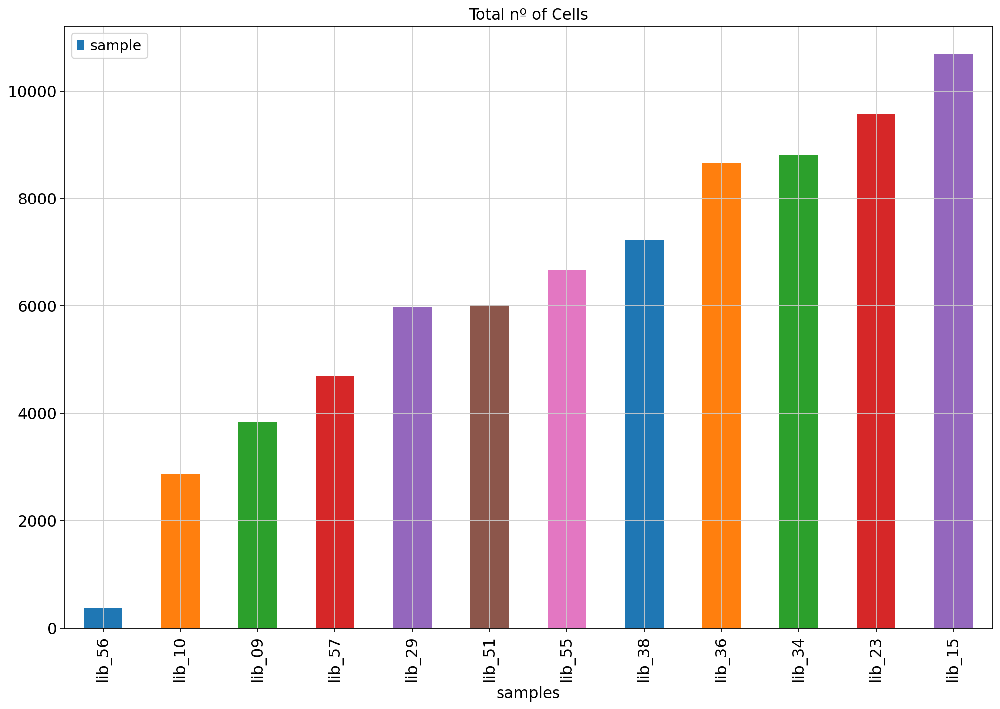

In [11]:
df.reindex(index=np.argsort(df['n_cells']).index.tolist()[::-1]).plot(kind='bar', x = 'samples', y ='n_cells', label ='sample', color = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2'], title = 'Total nº of Cells' )

In [12]:
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, subset=False)
sc.pp.scale(adata)
sc.pp.pca(adata)

In [13]:
sc.pp.neighbors(adata)
sc.tl.umap(adata)

In [14]:
adata.obs['Deepscore'] = sc.read('objects/Deepscore.h5ad').obs['Deepscore']

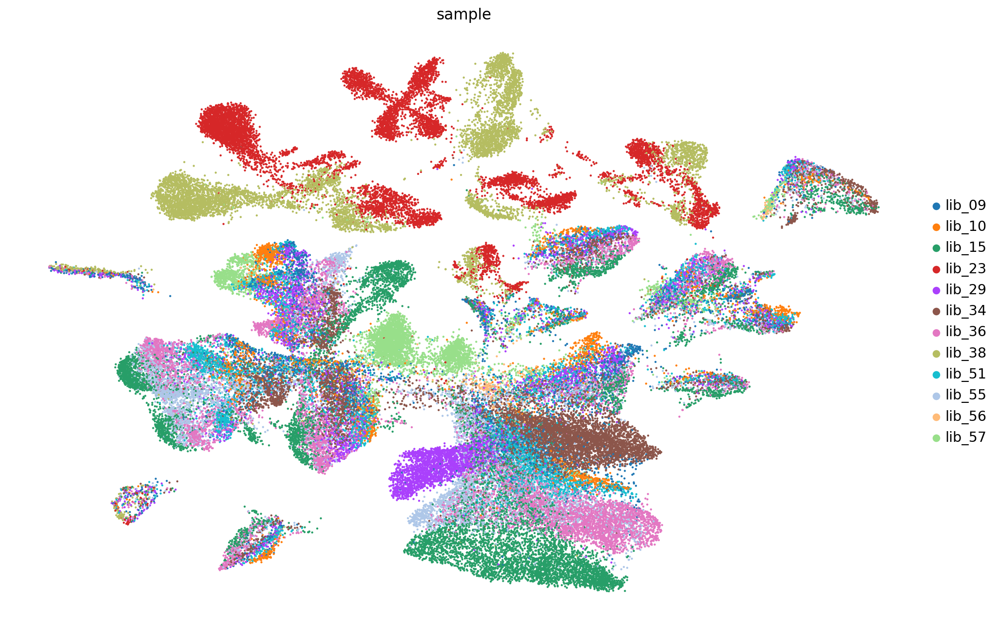

In [15]:
sc.pl.umap(adata, color = 'sample', frameon = False, size = 15)

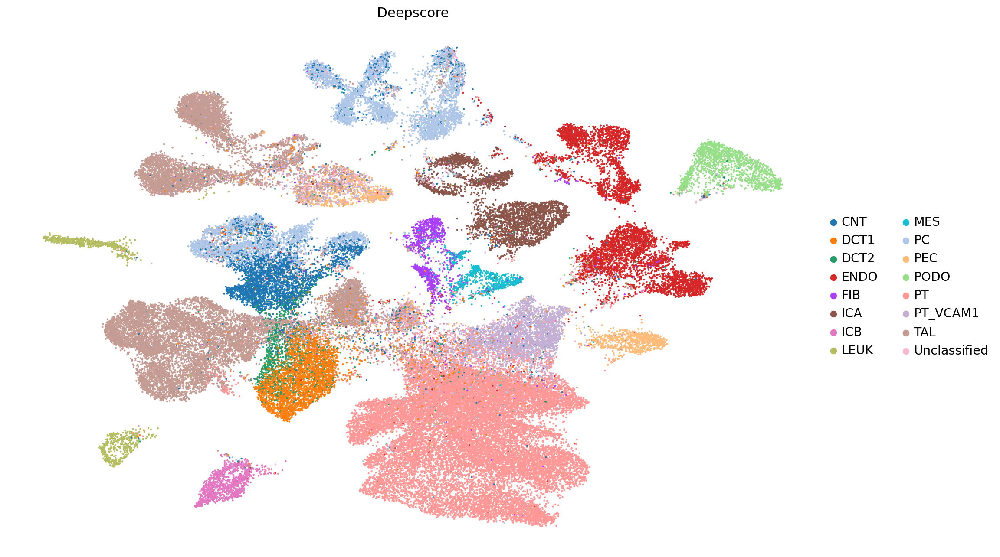

In [16]:
sc.pl.umap(adata, color = 'Deepscore', frameon = False, size = 15)

In [17]:
adata.obsm['X_umap_raw'] = adata.obsm['X_umap'].copy()

In [18]:
import harmonypy as hm
ho = hm.run_harmony(adata.obsm['X_pca'], adata.obs, 'sample')


2023-04-11 13:46:20,673 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2023-04-11 13:46:37,542 - harmonypy - INFO - sklearn.KMeans initialization complete.
2023-04-11 13:46:37,905 - harmonypy - INFO - Iteration 1 of 10
2023-04-11 13:47:03,540 - harmonypy - INFO - Iteration 2 of 10
2023-04-11 13:47:28,144 - harmonypy - INFO - Iteration 3 of 10
2023-04-11 13:47:53,143 - harmonypy - INFO - Iteration 4 of 10
2023-04-11 13:48:19,901 - harmonypy - INFO - Iteration 5 of 10
2023-04-11 13:48:49,410 - harmonypy - INFO - Converged after 5 iterations


In [19]:
harmonized = pd.DataFrame(ho.Z_corr.T, index = adata.obs.index)
harmonized.head(1)

,0,1,2,3,4,5,6,7,8,9,...,40,41,42,43,44,45,46,47,48,49
AAACAGCCAACTGGCT-8,-4.337014,-5.505725,2.981492,-10.449306,-3.030944,-4.080073,-5.243268,2.181149,-2.556517,0.639858,...,-0.111197,0.006485,-0.509847,0.029272,0.361591,0.697411,-0.605468,-0.161357,-0.99783,-0.577963


In [20]:
# Write the adjusted PCs to a new file.
adata.obsm['X_pca_harmonized'] = harmonized.values


In [21]:
sc.pp.neighbors(adata, use_rep='X_pca_harmonized')

In [28]:
sc.tl.umap(adata, spread = 1.75, min_dist = 0.2)

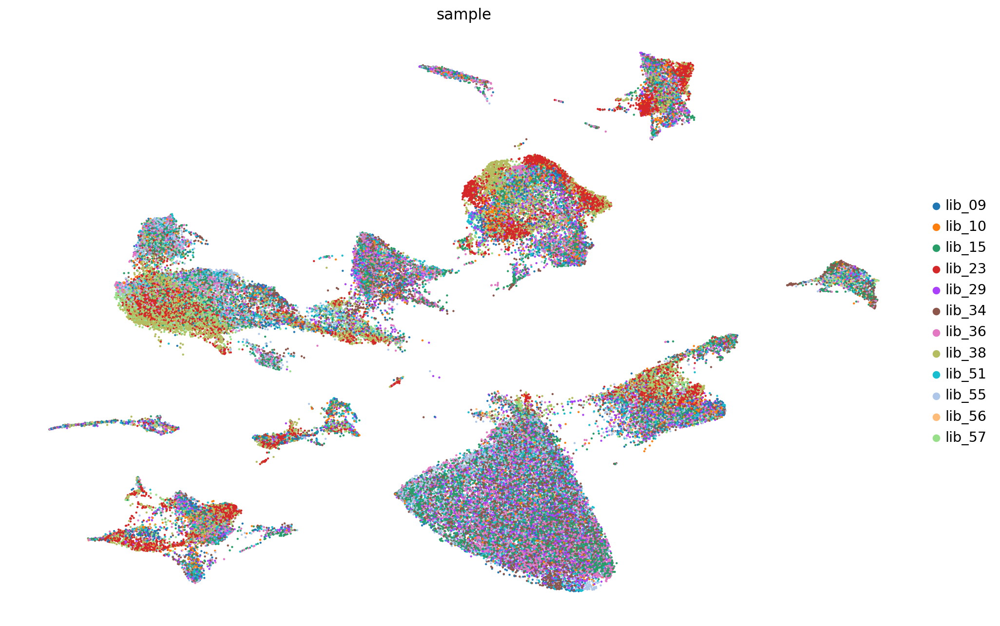

In [29]:
sc.pl.umap(adata, color = 'sample', frameon=False, size = 15)

In [33]:
adata.write('objects/merged_1stQC_Harmonized.h5ad')

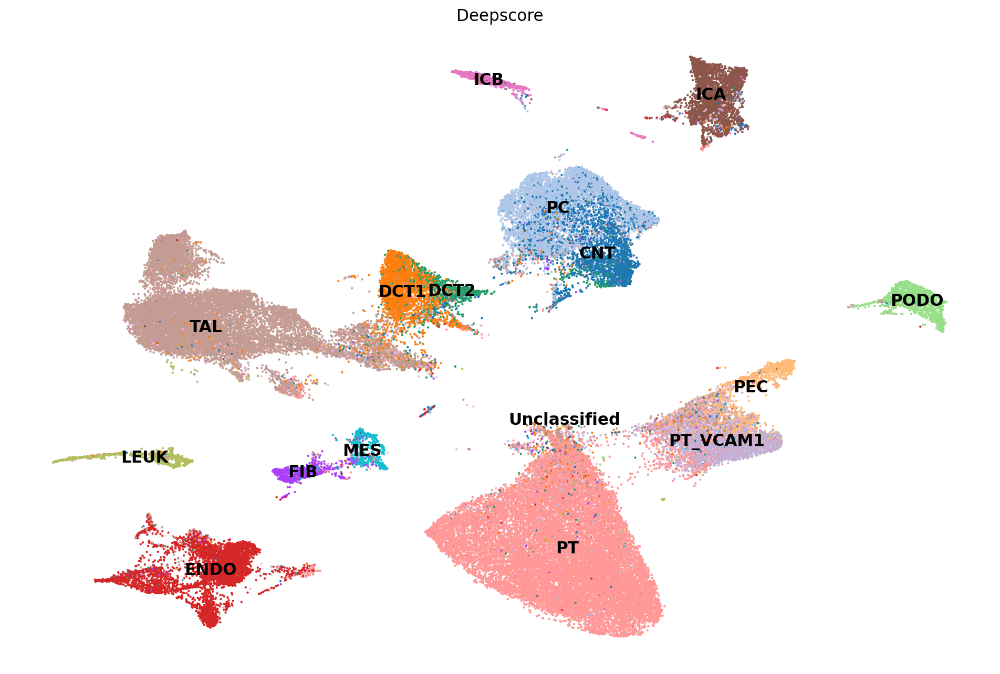

In [31]:
sc.pl.umap(adata, color = 'Deepscore', frameon=False, legend_loc='on data', size = 15)

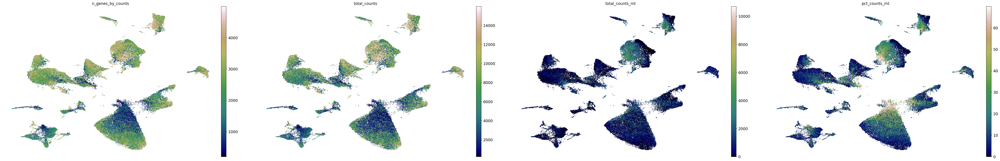

In [32]:
sc.pl.umap(adata, color = ['n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'], frameon=False, legend_loc='on data', size = 15)